#### Detecting anomalies using various techniques
 * This Notebook deals with detecting anomalies on events grouped by hour and then minute, aggregated on count.
 * The techniques explored are Persistence Model, Autoregression, Double Rolling Window, LOF and Isolation Forest.
 * The techniques are applied on 'hourly' and then on the 'per minute' data.
 * The above steps are repeated for events belonging to each eventIDCompact.

In [1]:
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio
from numpy import where, quantile
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_pacf
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.seasonal import STL
#from statsmodels.tsa.stl.mstl import MSTL
#from statsmodels.tsa.seasonal import MSTL
from statsmodels.tsa.seasonal import DecomposeResult
from datetime import datetime
from sklearn.ensemble import IsolationForest
from sklearn import preprocessing
from sklearn.neighbors import KernelDensity
from sklearn.neighbors import LocalOutlierFactor

In [2]:
#Importing the CSV.
%matplotlib notebook
df_main = pd.read_csv('./thesis/OTCEventsData.csv')
df_main['timestamp']= pd.to_datetime(df_main['timestamp'],format='%Y-%m-%d %H:%M:%S.%f')
df_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3118204 entries, 0 to 3118203
Data columns (total 8 columns):
 #   Column            Dtype              
---  ------            -----              
 0   eventID           object             
 1   eventIDCompact    object             
 2   eventPhase        object             
 3   system            object             
 4   timestamp         datetime64[ns, UTC]
 5   eventIDSteps      int64              
 6   retryCounter      float64            
 7   latencyInSeconds  float64            
dtypes: datetime64[ns, UTC](1), float64(2), int64(1), object(4)
memory usage: 190.3+ MB


In [3]:
#Removing duplicate rows and keeping the necessary columns.
duplicate_rows = df_main[df_main.duplicated()]
duplicate_rows.info()
df_main.drop_duplicates(inplace=True)
df_main.drop('eventID', axis=1, inplace=True)
df_main.set_index('timestamp', inplace=True)
df_main.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1898287 entries, 2027 to 3117822
Data columns (total 8 columns):
 #   Column            Dtype              
---  ------            -----              
 0   eventID           object             
 1   eventIDCompact    object             
 2   eventPhase        object             
 3   system            object             
 4   timestamp         datetime64[ns, UTC]
 5   eventIDSteps      int64              
 6   retryCounter      float64            
 7   latencyInSeconds  float64            
dtypes: datetime64[ns, UTC](1), float64(2), int64(1), object(4)
memory usage: 130.3+ MB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1219917 entries, 2023-07-31 00:04:38.649800100+00:00 to 2023-08-30 15:04:17.088217900+00:00
Data columns (total 6 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   eventIDCompact    1219917 non-null  object 
 1   eventPhase        1219917 non-null  ob

In [4]:
#Grouping events by 1 hour and aggregating the eventIDCompact by count.
df_hour = df_main.groupby(pd.Grouper(level='timestamp', freq='1H'))['eventIDCompact'].agg('count') 
df_hour = df_hour.to_frame().reset_index()
df_hour.rename(columns={"eventIDCompact": "eventCount"}, inplace=True)
df_hour.info()
df_hour.to_csv('./thesis/Events/eventsTotalHour.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype              
---  ------      --------------  -----              
 0   timestamp   736 non-null    datetime64[ns, UTC]
 1   eventCount  736 non-null    int64              
dtypes: datetime64[ns, UTC](1), int64(1)
memory usage: 11.6 KB


In [5]:
#Grouping events by 1 hour and aggregating the retryCounter by count.
df_retry_hour = df_main.groupby(pd.Grouper(level='timestamp', freq='1H'))['retryCounter'].agg('count') 
df_retry_hour = df_retry_hour.to_frame().reset_index()
#df_retry_hour.rename(columns={"retryCounter": "retryCounter"}, inplace=True)
df_retry_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   timestamp     736 non-null    datetime64[ns, UTC]
 1   retryCounter  736 non-null    int64              
dtypes: datetime64[ns, UTC](1), int64(1)
memory usage: 11.6 KB


In [6]:
#Calculating Mean of Events and Retries per Hour and visualizing them.
df_hour_mean = df_hour.copy()
df_hour_mean['timestamp_compare']=df_hour_mean['timestamp'].dt.strftime("%H:%M")
df_hour_mean = df_hour_mean.groupby('timestamp_compare')['eventCount'].agg('mean')
df_hour_mean = df_hour_mean.to_frame().reset_index()
print(df_hour_mean)
fig_hour_mean = px.line(df_hour_mean,
             x='timestamp_compare',
             y='eventCount',
             title='Time Series for Mean of Total Events per Hour',         
            )

df_hour_retry_mean = df_retry_hour.copy()
df_hour_retry_mean['timestamp_compare']=df_hour_retry_mean['timestamp'].dt.strftime("%H:%M")
df_hour_retry_mean = df_hour_retry_mean.groupby('timestamp_compare')['retryCounter'].agg('mean')
df_hour_retry_mean = df_hour_retry_mean.to_frame().reset_index()
fig_hour_retry_mean = px.line(df_hour_retry_mean,
             x='timestamp_compare',
             y='retryCounter',
             title='Time Series for Mean of Retry Events per Hour',   
             color_discrete_sequence=["#ff97ff"]                          
            )
fig_combined_mean_hour = go.Figure(data = fig_hour_retry_mean.data + fig_hour_mean.data)
fig_combined_mean_hour.show()

   timestamp_compare   eventCount
0              00:00   469.129032
1              01:00   351.032258
2              02:00   287.870968
3              03:00   247.483871
4              04:00  1419.548387
5              05:00   925.129032
6              06:00  1328.516129
7              07:00  1839.064516
8              08:00  2061.129032
9              09:00  2033.645161
10             10:00  1843.483871
11             11:00  1933.677419
12             12:00  1882.258065
13             13:00  1684.709677
14             14:00  2212.677419
15             15:00  2053.580645
16             16:00  1810.133333
17             17:00  1394.700000
18             18:00  1928.866667
19             19:00  1783.200000
20             20:00  1628.800000
21             21:00   605.333333
22             22:00  3102.333333
23             23:00  5085.166667


In [7]:
#Grouping events by 1 hour and aggregating the latencyInSeconds by sum.
df_hour_latencySum = df_main.groupby(pd.Grouper(level='timestamp', freq='1H'))['latencyInSeconds'].agg('sum') 
df_hour_latencySum = df_hour_latencySum.to_frame().reset_index()
df_hour_latencySum.rename(columns={"latencyInSeconds": "latencyInSecondsSum"}, inplace=True)
df_hour_latencySum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   timestamp            736 non-null    datetime64[ns, UTC]
 1   latencyInSecondsSum  736 non-null    float64            
dtypes: datetime64[ns, UTC](1), float64(1)
memory usage: 11.6 KB


In [8]:
from adtk.data import validate_series
from adtk.visualization import plot
from adtk.detector import PersistAD
from adtk.detector import AutoregressionAD
from adtk.transformer import DoubleRollingAggregate
from adtk.detector import OutlierDetector

<IPython.core.display.Javascript object>


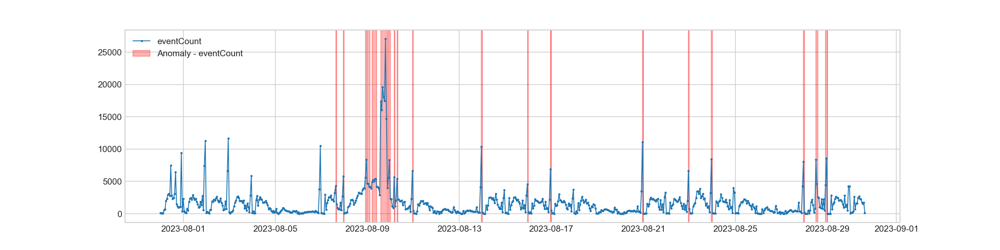

<IPython.core.display.Javascript object>


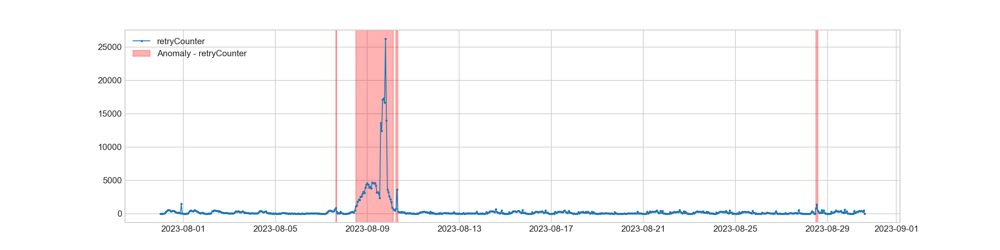

In [96]:
#Detecting anomalies using PersistAD from ADTK library.
eventCount_time_series_hour = df_hour.copy()
retry_time_series_hour = df_retry_hour.copy()
eventCount_time_series_hour.set_index('timestamp', inplace=True)
retry_time_series_hour.set_index('timestamp', inplace=True)
eventCount_time_series_hour = validate_series(eventCount_time_series_hour)
retry_time_series_hour = validate_series(retry_time_series_hour)
persist_eventCount_hour = PersistAD(window=168, c=3.0, side='positive')
persist_retry_hour = PersistAD(window=168, c=3.0, side='positive')
anomalies_eventCount_hour = persist_eventCount_hour.fit_detect(eventCount_time_series_hour)
anomalies_retry_hour = persist_retry_hour.fit_detect(retry_time_series_hour)
plot(eventCount_time_series_hour, anomaly=anomalies_eventCount_hour, ts_linewidth=1, ts_markersize=3, anomaly_color='red');
plt.savefig('./thesis/Events/Photos/persistent_hour_event.png',bbox_inches='tight')
plot(retry_time_series_hour, anomaly=anomalies_retry_hour, ts_linewidth=1, ts_markersize=3, anomaly_color='red');
plt.savefig('./thesis/Events/Photos/persistent_hour.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


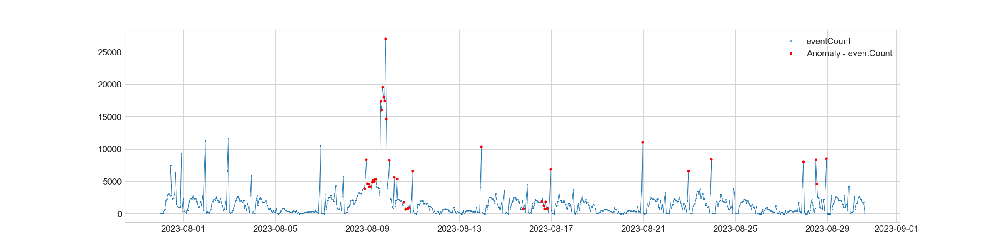

                          eventCount
timestamp                           
2023-07-31 00:00:00+00:00        NaN
2023-07-31 01:00:00+00:00        NaN
2023-07-31 02:00:00+00:00        NaN
2023-07-31 03:00:00+00:00        NaN
2023-07-31 04:00:00+00:00        NaN
...                              ...
2023-08-30 11:00:00+00:00      False
2023-08-30 12:00:00+00:00      False
2023-08-30 13:00:00+00:00      False
2023-08-30 14:00:00+00:00      False
2023-08-30 15:00:00+00:00      False

[736 rows x 1 columns]


In [66]:
#Detecting anomalies using AutoregressionAD from ADTK library.
autoregression_ad_hour = AutoregressionAD(n_steps=7, step_size=24, c=3.0)
anomalies_hour = autoregression_ad_hour.fit_detect(eventCount_time_series_hour)
plot(eventCount_time_series_hour, anomaly=anomalies_hour, ts_markersize=1, anomaly_color='red', anomaly_tag="marker", anomaly_markersize=2);
print(anomalies_hour)
plt.savefig('./thesis/Events/Photos/auto_hour.png',bbox_inches='tight')

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 736 entries, 2023-07-31 00:00:00+00:00 to 2023-08-30 15:00:00+00:00
Freq: H
Data columns (total 1 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   eventCountDifference  689 non-null    float64
dtypes: float64(1)
memory usage: 11.5 KB


<IPython.core.display.Javascript object>


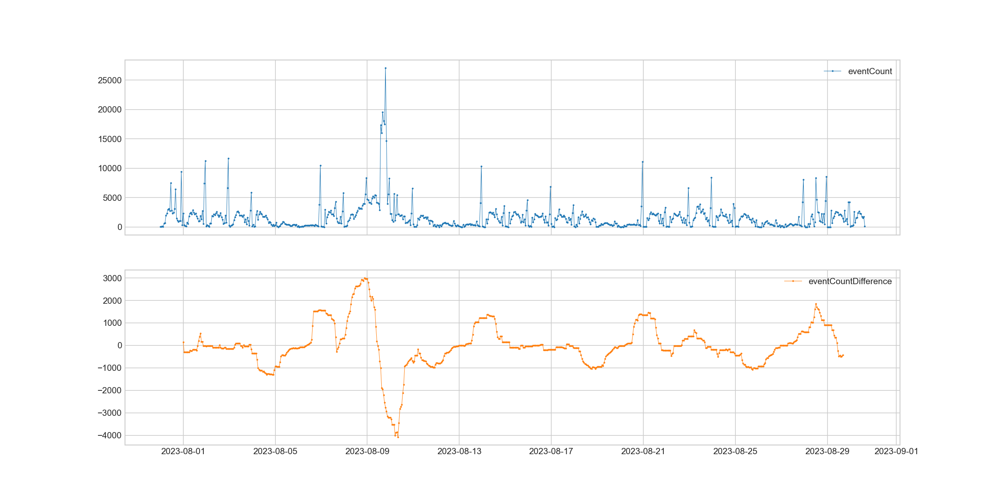

In [67]:
#Detecting anomalies using DoubleRollingAggregate from ADTK library.
eventCount_time_series_hourRolling = df_hour.copy()

eventCount_time_series_hourRolling.set_index('timestamp', inplace=True)
eventCount_time_series_hourRolling = validate_series(eventCount_time_series_hourRolling)
s_transformed_hourRolling = DoubleRollingAggregate(
    agg="median",
    window=24,
    diff="diff").transform(eventCount_time_series_hourRolling)

s_transformed_hourRolling.rename(columns={'eventCount': 'eventCountDifference'}, inplace=True)
 #= "Diff rolling quantiles (mm)"
s_transformed_hourRolling.info()
plot(pd.concat([eventCount_time_series_hourRolling, s_transformed_hourRolling], axis=1));
plt.savefig('./thesis/Events/Photos/doublerolling_hour.png',bbox_inches='tight')

In [12]:
inner_merged_hour1 = pd.merge(df_hour, df_retry_hour, on=["timestamp"])
#inner_merged_hour = pd.merge(inner_merged_hour1, df_hour_latencySum, on=["timestamp"])
inner_merged_hour1.set_index('timestamp', inplace=True)
inner_merged_hour1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 736 entries, 2023-07-31 00:00:00+00:00 to 2023-08-30 15:00:00+00:00
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   eventCount    736 non-null    int64
 1   retryCounter  736 non-null    int64
dtypes: int64(2)
memory usage: 17.2 KB


<IPython.core.display.Javascript object>


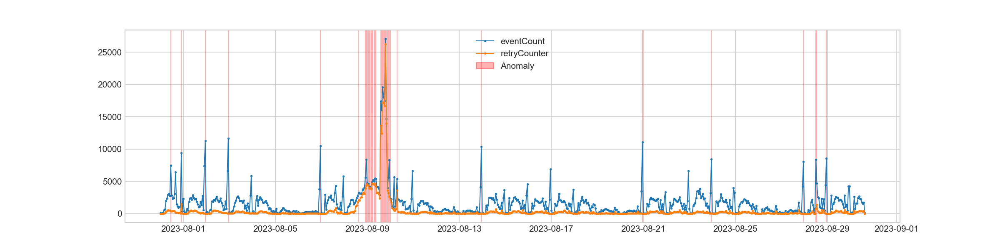

In [68]:
#Detecting anomalies using OutlierDetector with isolation forest from ADTK library on multivariate time series of eventCount and retryCounter.
outlier_detector_multiHour = OutlierDetector(IsolationForest(contamination=float(0.05), random_state=0))
anomalies_multiHour = outlier_detector_multiHour.fit_detect(inner_merged_hour1)
plot(inner_merged_hour1, anomaly=anomalies_multiHour, ts_linewidth=1, ts_markersize=3, anomaly_color='red', anomaly_alpha=0.3, curve_group='all');
plt.savefig('./thesis/Events/Photos/IF_hour.png',bbox_inches='tight')

In [14]:
#Grouping events by 1 minute and aggregating the eventIDCompact by count.
df_minute = df_main.groupby(pd.Grouper(level='timestamp', freq='1T'))['eventIDCompact'].agg('count') 
df_minute = df_minute.to_frame().reset_index()
df_minute.rename(columns={"eventIDCompact": "eventCount"}, inplace=True)
df_minute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44101 entries, 0 to 44100
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype              
---  ------      --------------  -----              
 0   timestamp   44101 non-null  datetime64[ns, UTC]
 1   eventCount  44101 non-null  int64              
dtypes: datetime64[ns, UTC](1), int64(1)
memory usage: 689.2 KB


In [15]:
#Grouping events by 1 minute and aggregating the retryCounter by count.
df_minute_retry = df_main.groupby(pd.Grouper(level='timestamp', freq='1T'))['retryCounter'].agg('count') 
df_minute_retry = df_minute_retry.to_frame().reset_index()
#df_minute.rename(columns={"eventIDCompact": "eventIDCount"}, inplace=True)
df_minute_retry.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44101 entries, 0 to 44100
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   timestamp     44101 non-null  datetime64[ns, UTC]
 1   retryCounter  44101 non-null  int64              
dtypes: datetime64[ns, UTC](1), int64(1)
memory usage: 689.2 KB


In [16]:
#Grouping events by 1 minute and aggregating the latencyInSeconds by sum.
df_minute_latencySum = df_main.groupby(pd.Grouper(level='timestamp', freq='1T'))['latencyInSeconds'].agg('sum') 
df_minute_latencySum = df_minute_latencySum.to_frame().reset_index()
df_minute_latencySum.rename(columns={"latencyInSeconds": "latencyInSecondsSum"}, inplace=True)
df_minute_latencySum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44101 entries, 0 to 44100
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   timestamp            44101 non-null  datetime64[ns, UTC]
 1   latencyInSecondsSum  44101 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(1)
memory usage: 689.2 KB


<IPython.core.display.Javascript object>


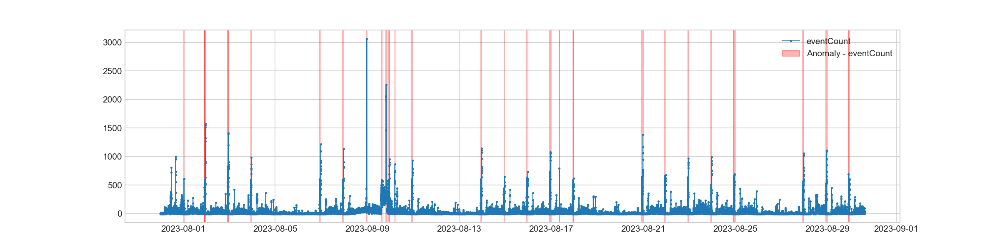

<IPython.core.display.Javascript object>


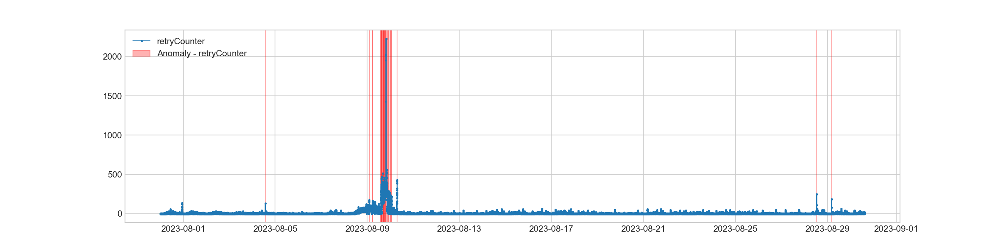

In [98]:
#Detecting anomalies per minute using PersistAD from ADTK library.
eventCount_time_series_minute = df_minute.copy()
retry_time_series_minute = df_minute_retry.copy()
eventCount_time_series_minute.set_index('timestamp', inplace=True)
retry_time_series_minute.set_index('timestamp', inplace=True)
eventCount_time_series_minute = validate_series(eventCount_time_series_minute)
retry_time_series_minute = validate_series(retry_time_series_minute)
persist_eventCount_minute = PersistAD(window=1440, c=30.0, side='positive')
persist_retry_minute = PersistAD(window=1440, c=30.0, side='positive')
anomalies_eventCount_minute = persist_eventCount_minute.fit_detect(eventCount_time_series_minute)
anomalies_retry_minute = persist_retry_minute.fit_detect(retry_time_series_minute)
plot(eventCount_time_series_minute, anomaly=anomalies_eventCount_minute, ts_linewidth=1, ts_markersize=3, anomaly_color='red');
plt.savefig('./thesis/Events/Photos/persistent_minute_event.png',bbox_inches='tight')
plot(retry_time_series_minute, anomaly=anomalies_retry_minute, ts_linewidth=1, ts_markersize=3, anomaly_color='red');
plt.savefig('./thesis/Events/Photos/persistent_minute.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


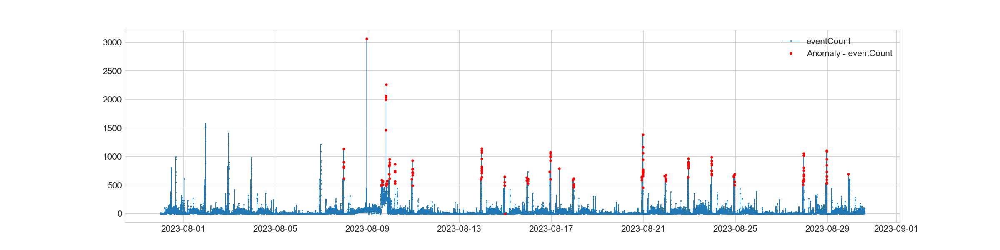

In [18]:
#Detecting anomalies per minute using AutoregressionAD from ADTK library.
autoregression_ad_minute = AutoregressionAD(n_steps=7, step_size=1440, c=30.0)
anomalies_minute = autoregression_ad_minute.fit_detect(eventCount_time_series_minute)
plot(eventCount_time_series_minute, anomaly=anomalies_minute, ts_markersize=1, anomaly_color='red', anomaly_tag="marker", anomaly_markersize=2);

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 44101 entries, 2023-07-31 00:04:00+00:00 to 2023-08-30 15:04:00+00:00
Freq: T
Data columns (total 1 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   eventCountDifference  43982 non-null  float64
dtypes: float64(1)
memory usage: 689.1 KB


<IPython.core.display.Javascript object>


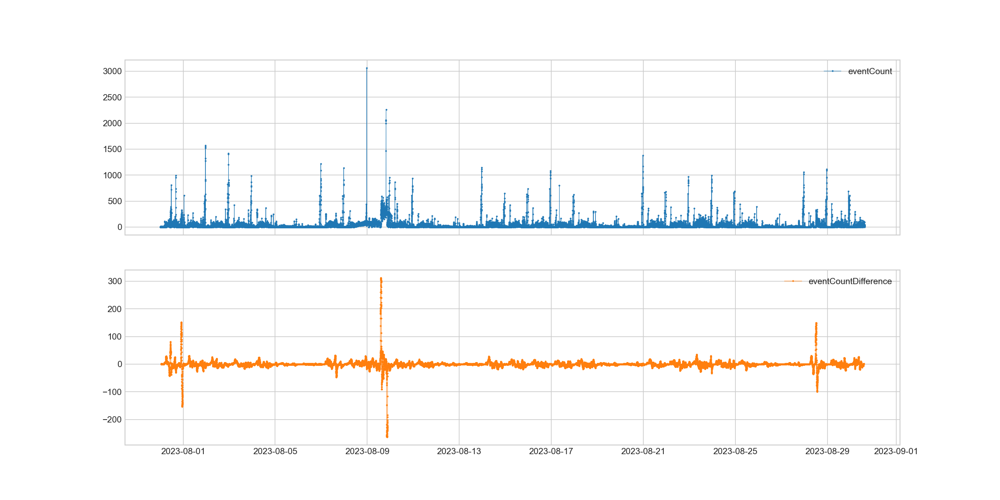

In [154]:
#Detecting anomalies using DoubleRollingAggregate from ADTK library.
eventCount_time_series_minuteRolling = df_minute.copy()

eventCount_time_series_minuteRolling.set_index('timestamp', inplace=True)
eventCount_time_series_minuteRolling = validate_series(eventCount_time_series_minuteRolling)
s_transformed_minuteRolling = DoubleRollingAggregate(
    agg="median",
    window=60,
    diff="diff").transform(eventCount_time_series_minuteRolling)

s_transformed_minuteRolling.rename(columns={'eventCount': 'eventCountDifference'}, inplace=True)
 #= "Diff rolling quantiles (mm)"
s_transformed_minuteRolling.info()
plot(pd.concat([eventCount_time_series_minuteRolling, s_transformed_minuteRolling], axis=1));
plt.savefig('./thesis/Events/Photos/doublerolling_minute.png',bbox_inches='tight')

In [20]:
inner_merged_minute1 = pd.merge(df_minute, df_minute_retry, on=["timestamp"])
#inner_merged_minute = pd.merge(inner_merged_minute1, df_minute_latencySum, on=["timestamp"])
inner_merged_minute1.set_index('timestamp', inplace=True)
inner_merged_minute1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 44101 entries, 2023-07-31 00:04:00+00:00 to 2023-08-30 15:04:00+00:00
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   eventCount    44101 non-null  int64
 1   retryCounter  44101 non-null  int64
dtypes: int64(2)
memory usage: 1.0 MB


<IPython.core.display.Javascript object>


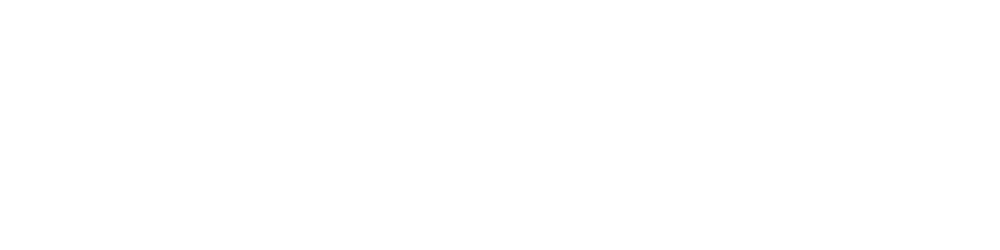

In [97]:
#Detecting anomalies per minute using OutlierDetector with isolation forest from ADTK library on multivariate time series of eventCount and retryCounter.

outlier_detector_multiminute = OutlierDetector(IsolationForest(contamination=float(0.01), random_state=0))
anomalies_multiminute = outlier_detector_multiminute.fit_detect(inner_merged_minute1)
plot(inner_merged_minute1, anomaly=anomalies_multiminute, ts_linewidth=1, ts_markersize=3, anomaly_color='red', anomaly_alpha=0.3, curve_group='all');
plt.savefig('./thesis/Events/Photos/IF_minute.png',bbox_inches='tight')

In [132]:
# Repeating the steps mentioned above for every unique eventIDCompact.
selectEvent = '20'
df_event = df_main[df_main['eventIDCompact'] == selectEvent]
df_event.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 362694 entries, 2023-07-31 00:07:58.803343300+00:00 to 2023-08-30 15:04:02.594115300+00:00
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   eventIDCompact    362694 non-null  object 
 1   eventPhase        362694 non-null  object 
 2   system            362694 non-null  object 
 3   eventIDSteps      362694 non-null  int64  
 4   retryCounter      52617 non-null   float64
 5   latencyInSeconds  362694 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 19.4+ MB


In [133]:
df_event_diff = df_event.copy()
df_event_diff.reset_index(inplace=True)
df_event_diff['Diff'] = df_event_diff.timestamp.diff()

fig_event_diff = px.line(df_event_diff,
             x='timestamp',
             y='Diff',
             title='Time Series for Difference'   
            )

#fig_event_diff.show()

In [134]:
df_event_hour = df_event.groupby(pd.Grouper(level='timestamp', freq='1H'))['eventIDCompact'].agg('count') 
df_event_hour = df_event_hour.to_frame().reset_index()
df_event_hour.rename(columns={"eventIDCompact": "eventIDCount"}, inplace=True)
df_event_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   timestamp     736 non-null    datetime64[ns, UTC]
 1   eventIDCount  736 non-null    int64              
dtypes: datetime64[ns, UTC](1), int64(1)
memory usage: 11.6 KB


In [135]:
df_event_hour_retry = df_event.groupby(pd.Grouper(level='timestamp', freq='1H'))['retryCounter'].agg('count') 
df_event_hour_retry = df_event_hour_retry.to_frame().reset_index()
#df_event_hour.rename(columns={"eventIDCompact": "eventIDCount"}, inplace=True)
df_event_hour_retry.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   timestamp     736 non-null    datetime64[ns, UTC]
 1   retryCounter  736 non-null    int64              
dtypes: datetime64[ns, UTC](1), int64(1)
memory usage: 11.6 KB


In [136]:
df_event_hour_mean = df_event_hour.copy()
df_event_hour_mean['timestamp_compare']=df_event_hour_mean['timestamp'].dt.strftime("%H:%M")
df_event_hour_mean = df_event_hour_mean.groupby('timestamp_compare')['eventIDCount'].agg('mean')
df_event_hour_mean = df_event_hour_mean.to_frame().reset_index()
fig_event_hour_mean = px.line(df_event_hour_mean,
             x='timestamp_compare',
             y='eventIDCount',
             title='Time Series for Mean of Total Events per Hour for Event '+selectEvent,         
            )

df_event_hour_retry_mean = df_event_hour_retry.copy()
df_event_hour_retry_mean['timestamp_compare']=df_event_hour_retry_mean['timestamp'].dt.strftime("%H:%M")
df_event_hour_retry_mean = df_event_hour_retry_mean.groupby('timestamp_compare')['retryCounter'].agg('mean')
df_event_hour_retry_mean = df_event_hour_retry_mean.to_frame().reset_index()
fig_event_hour_retry_mean = px.line(df_event_hour_retry_mean,
             x='timestamp_compare',
             y='retryCounter',
             title='Time Series for Mean of Retry Events per Hour for Event '+selectEvent,   
             color_discrete_sequence=["#ff97ff"]                          
            )
fig_combined_mean_hour = go.Figure(data = fig_event_hour_retry_mean.data + fig_event_hour_mean.data)
fig_combined_mean_hour.show()

In [137]:
df_event_hour_latencySum = df_event.groupby(pd.Grouper(level='timestamp', freq='1H'))['latencyInSeconds'].agg('sum') 
df_event_hour_latencySum = df_event_hour_latencySum.to_frame().reset_index()
df_event_hour_latencySum.rename(columns={"latencyInSeconds": "latencyInSecondsSum"}, inplace=True)
df_event_hour_latencySum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   timestamp            736 non-null    datetime64[ns, UTC]
 1   latencyInSecondsSum  736 non-null    float64            
dtypes: datetime64[ns, UTC](1), float64(1)
memory usage: 11.6 KB


In [138]:
fig_event_hour = px.line(df_event_hour,
             x='timestamp',
             y='eventIDCount',
             title='Time Series for EventCount per Hour for Event '+selectEvent,         
            )

fig_event_hour_retry = px.line(df_event_hour_retry,
             x='timestamp',
             y='retryCounter',
             title='Time Series of Retry Events per Hour for Event '+selectEvent,
             color_discrete_sequence=["#ff97ff"]            
             #color='retryCounter',         
             #color_continuous_scale='purples'              
            )

fig_combined_event_hour = go.Figure(data = fig_event_hour_retry.data + fig_event_hour.data)
fig_combined_event_hour.show()

In [139]:
df_event_hour_median = df_event_hour.copy()
df_event_hour_median['timestamp_compare']=df_event_hour_median['timestamp'].dt.strftime("%H:%M")
df_event_hour_median = df_event_hour_median.groupby('timestamp_compare')['eventIDCount'].median()
df_event_hour_median = df_event_hour_median.to_frame().reset_index()
fig_event_hour_median = px.line(df_event_hour_median,
             x='timestamp_compare',
             y='eventIDCount',
             title='Time Series for Mean of Total Events per Hour for Event '+selectEvent,         
            )

df_event_hour_retry_median = df_event_hour_retry.copy()
df_event_hour_retry_median['timestamp_compare']=df_event_hour_retry_median['timestamp'].dt.strftime("%H:%M")
df_event_hour_retry_median = df_event_hour_retry_median.groupby('timestamp_compare')['retryCounter'].median()
df_event_hour_retry_median = df_event_hour_retry_median.to_frame().reset_index()
fig_event_hour_retry_median = px.line(df_event_hour_retry_median,
             x='timestamp_compare',
             y='retryCounter',
             title='Time Series for Mean of Retry Events per Hour for Event '+selectEvent,   
             color_discrete_sequence=["#ff97ff"]                          
            )

fig_combined_median_hour = go.Figure(data = fig_event_hour_retry_median.data + fig_event_hour_median.data)
fig_combined_median_hour.show()

<IPython.core.display.Javascript object>


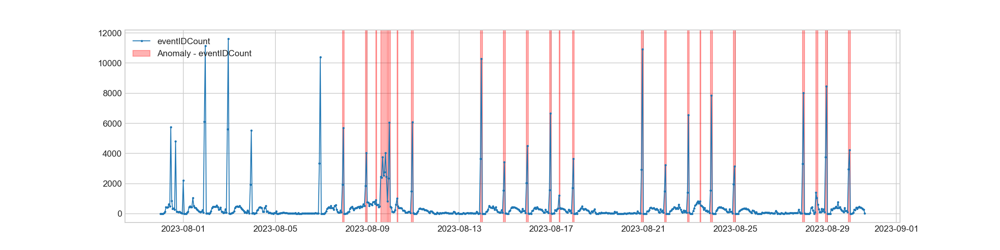

<IPython.core.display.Javascript object>


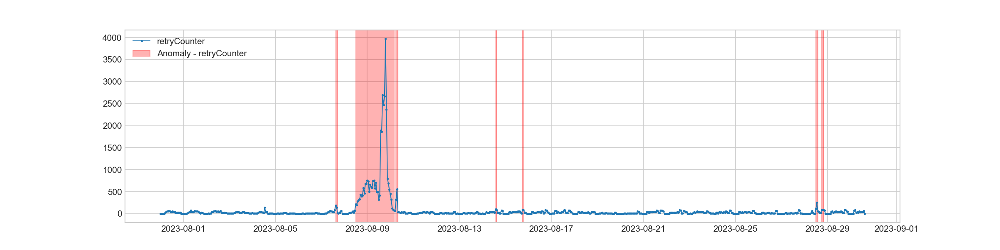

In [140]:
eventCount_time_series_event_hour = df_event_hour.copy()
retry_time_series_event_hour = df_event_hour_retry.copy()
eventCount_time_series_event_hour.set_index('timestamp', inplace=True)
retry_time_series_event_hour.set_index('timestamp', inplace=True)
eventCount_time_series_event_hour = validate_series(eventCount_time_series_event_hour)
retry_time_series_event_hour = validate_series(retry_time_series_event_hour)
persist_eventCount_event_hour = PersistAD(window=168, c=3.0, side='positive')
persist_retry_event_hour = PersistAD(window=168, c=3.0, side='positive')
anomalies_eventCount_event_hour = persist_eventCount_event_hour.fit_detect(eventCount_time_series_event_hour)
anomalies_retry_event_hour = persist_retry_event_hour.fit_detect(retry_time_series_event_hour)
plot(eventCount_time_series_event_hour, anomaly=anomalies_eventCount_event_hour, ts_linewidth=1, ts_markersize=3, anomaly_color='red');
plot(retry_time_series_event_hour, anomaly=anomalies_retry_event_hour, ts_linewidth=1, ts_markersize=3, anomaly_color='red');

<IPython.core.display.Javascript object>


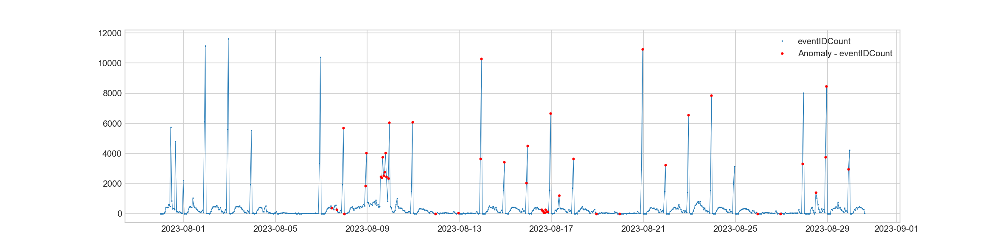

                          eventIDCount
timestamp                             
2023-07-31 00:00:00+00:00          NaN
2023-07-31 01:00:00+00:00          NaN
2023-07-31 02:00:00+00:00          NaN
2023-07-31 03:00:00+00:00          NaN
2023-07-31 04:00:00+00:00          NaN
...                                ...
2023-08-30 11:00:00+00:00        False
2023-08-30 12:00:00+00:00        False
2023-08-30 13:00:00+00:00        False
2023-08-30 14:00:00+00:00        False
2023-08-30 15:00:00+00:00        False

[736 rows x 1 columns]


In [141]:
autoregression_ad_event_hour = AutoregressionAD(n_steps=7, step_size=24, c=3.0)
anomalies_event_hour = autoregression_ad_event_hour.fit_detect(eventCount_time_series_event_hour)
plot(eventCount_time_series_event_hour, anomaly=anomalies_event_hour, ts_markersize=1, anomaly_color='red', anomaly_tag="marker", anomaly_markersize=2);
print(anomalies_event_hour)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 736 entries, 2023-07-31 00:00:00+00:00 to 2023-08-30 15:00:00+00:00
Freq: H
Data columns (total 1 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   eventIDCountDifference  689 non-null    float64
dtypes: float64(1)
memory usage: 11.5 KB


<IPython.core.display.Javascript object>


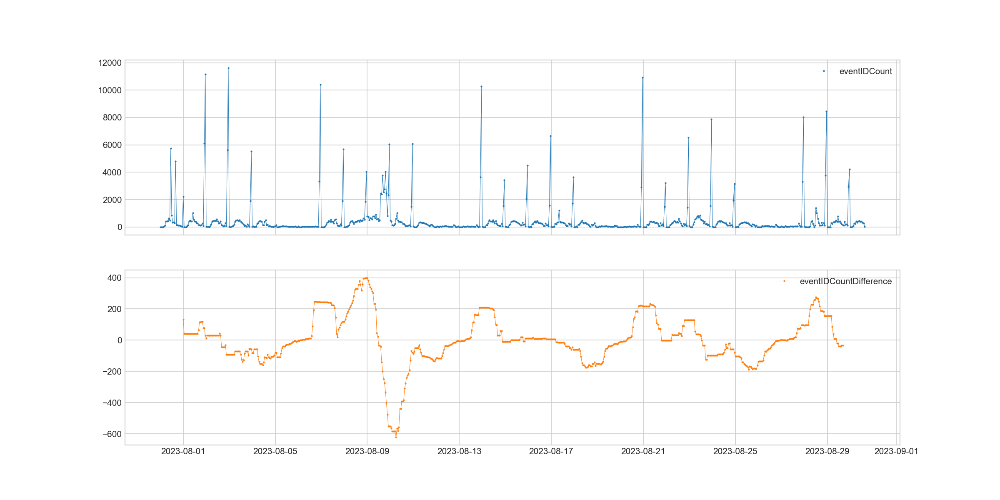

In [142]:
eventCount_time_series_event_hourRolling = df_event_hour.copy()

eventCount_time_series_event_hourRolling.set_index('timestamp', inplace=True)
eventCount_time_series_event_hourRolling = validate_series(eventCount_time_series_event_hourRolling)
s_transformed_event_hourRolling = DoubleRollingAggregate(
    agg="median",
    window=24,
    diff="diff").transform(eventCount_time_series_event_hourRolling)

s_transformed_event_hourRolling.rename(columns={'eventIDCount': 'eventIDCountDifference'}, inplace=True)
 #= "Diff rolling quantiles (mm)"
s_transformed_event_hourRolling.info()
plot(pd.concat([eventCount_time_series_event_hourRolling, s_transformed_event_hourRolling], axis=1));
plt.savefig('./thesis/Events/Photos/DoubleRolling_'+selectEvent+'_hour.png',bbox_inches='tight')

In [143]:
inner_merged_event_hour1 = pd.merge(df_event_hour, df_event_hour_retry, on=["timestamp"])
#inner_merged_event_hour = pd.merge(inner_merged_event_hour1, df_event_hour_latencySum, on=["timestamp"])
inner_merged_event_hour1.set_index('timestamp', inplace=True)
inner_merged_event_hour1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 736 entries, 2023-07-31 00:00:00+00:00 to 2023-08-30 15:00:00+00:00
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   eventIDCount  736 non-null    int64
 1   retryCounter  736 non-null    int64
dtypes: int64(2)
memory usage: 17.2 KB


<IPython.core.display.Javascript object>


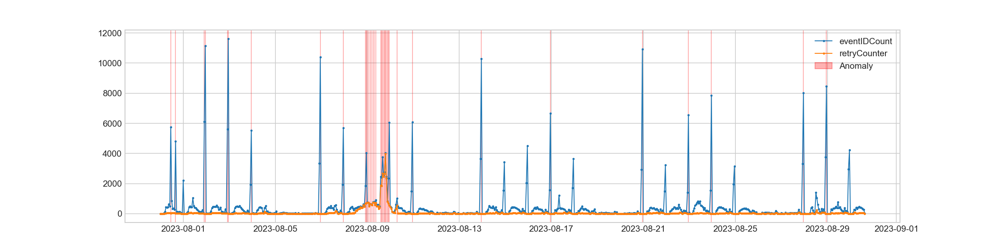

In [144]:
outlier_detector_multi_eventHour = OutlierDetector(IsolationForest(contamination=float(0.05), random_state=0))
anomalies_multi_event_hour = outlier_detector_multi_eventHour.fit_detect(inner_merged_event_hour1)
plot(inner_merged_event_hour1, anomaly=anomalies_multi_event_hour, ts_linewidth=1, ts_markersize=3, anomaly_color='red', anomaly_alpha=0.3, curve_group='all');

In [145]:
df_event_minute = df_event.groupby(pd.Grouper(level='timestamp', freq='1T'))['eventIDCompact'].agg('count')
df_event_minute = df_event_minute.to_frame().reset_index()
df_event_minute.rename(columns={"eventIDCompact": "eventIDCount"}, inplace=True)
df_event_minute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44098 entries, 0 to 44097
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   timestamp     44098 non-null  datetime64[ns, UTC]
 1   eventIDCount  44098 non-null  int64              
dtypes: datetime64[ns, UTC](1), int64(1)
memory usage: 689.2 KB


In [146]:
df_event_minute_retry = df_event.groupby(pd.Grouper(level='timestamp', freq='1T'))['retryCounter'].agg('count') 
df_event_minute_retry = df_event_minute_retry.to_frame().reset_index()
#df_event_minute.rename(columns={"eventIDCompact": "eventIDCount"}, inplace=True)
df_event_minute_retry.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44098 entries, 0 to 44097
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   timestamp     44098 non-null  datetime64[ns, UTC]
 1   retryCounter  44098 non-null  int64              
dtypes: datetime64[ns, UTC](1), int64(1)
memory usage: 689.2 KB


In [147]:
df_event_minute_latencySum = df_event.groupby(pd.Grouper(level='timestamp', freq='1T'))['latencyInSeconds'].agg('sum') 
df_event_minute_latencySum = df_event_minute_latencySum.to_frame().reset_index()
df_event_minute_latencySum.rename(columns={"latencyInSeconds": "latencyInSecondsSum"}, inplace=True)
df_event_minute_latencySum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44098 entries, 0 to 44097
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   timestamp            44098 non-null  datetime64[ns, UTC]
 1   latencyInSecondsSum  44098 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(1)
memory usage: 689.2 KB


In [148]:
fig_event_minute = px.line(df_event_minute,
             x='timestamp',
             y='eventIDCount',
             title='Time Series for EventCount per minute for Event '+selectEvent,         
            )

fig_event_minute_retry = px.line(df_event_minute_retry,
             x='timestamp',
             y='retryCounter',
             title='Time Series of Retry Events per minute for Event '+selectEvent,
             color_discrete_sequence=["#ff97ff"]            
             #color='retryCounter',         
             #color_continuous_scale='purples'              
            )

fig_combined_event_minute = go.Figure(data = fig_event_minute.data + fig_event_minute_retry.data)
fig_combined_event_minute.show()

<IPython.core.display.Javascript object>


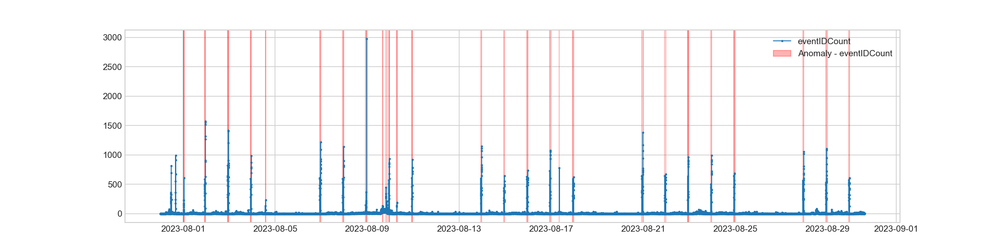

<IPython.core.display.Javascript object>


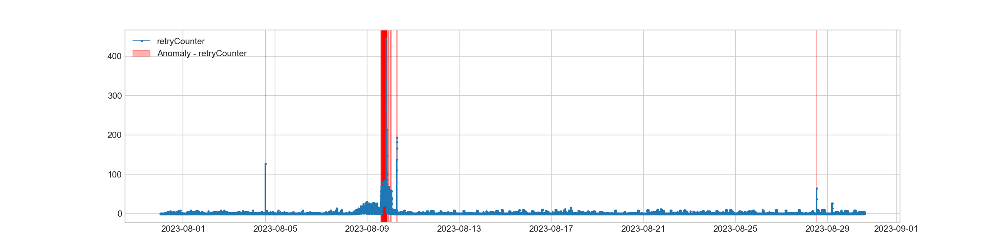

In [149]:
eventCount_time_series_event_minute = df_event_minute
retry_time_series_event_minute = df_event_minute_retry
eventCount_time_series_event_minute.set_index('timestamp', inplace=True)
retry_time_series_event_minute.set_index('timestamp', inplace=True)
eventCount_time_series_event_minute = validate_series(eventCount_time_series_event_minute)
retry_time_series_event_minute = validate_series(retry_time_series_event_minute)
persist_eventCount_event_minute = PersistAD(window=1440, c=30.0, side='positive')
persist_retry_event_minute = PersistAD(window=1440, c=30.0, side='positive')
anomalies_eventCount_event_minute = persist_eventCount_event_minute.fit_detect(eventCount_time_series_event_minute)
anomalies_retry_event_minute = persist_retry_event_minute.fit_detect(retry_time_series_event_minute)
plot(eventCount_time_series_event_minute, anomaly=anomalies_eventCount_event_minute, ts_linewidth=1, ts_markersize=3, anomaly_color='red');
plot(retry_time_series_event_minute, anomaly=anomalies_retry_event_minute, ts_linewidth=1, ts_markersize=3, anomaly_color='red');

<IPython.core.display.Javascript object>


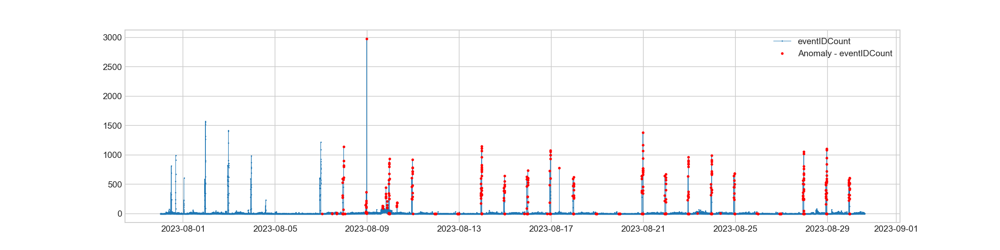

In [150]:
autoregression_ad_event_minute = AutoregressionAD(n_steps=7, step_size=1440, c=30.0)
anomalies_event_minute = autoregression_ad_event_minute.fit_detect(eventCount_time_series_event_minute)
plot(eventCount_time_series_event_minute, anomaly=anomalies_event_minute, ts_markersize=1, anomaly_color='red', anomaly_tag="marker", anomaly_markersize=2);

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 44098 entries, 2023-07-31 00:07:00+00:00 to 2023-08-30 15:04:00+00:00
Freq: T
Data columns (total 1 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   eventIDCountDifference  43979 non-null  float64
dtypes: float64(1)
memory usage: 689.0 KB


<IPython.core.display.Javascript object>


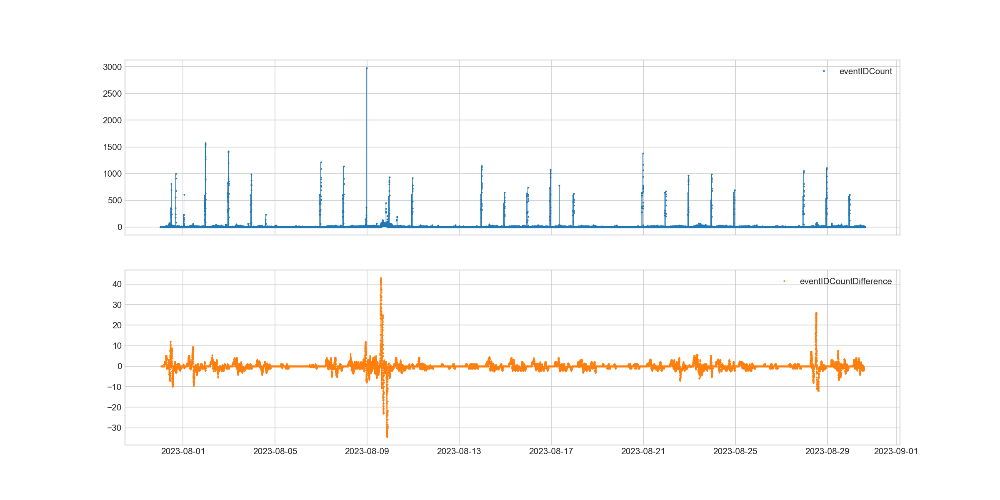

In [151]:
eventCount_time_series_event_minuteRolling = df_event_minute

#eventCount_time_series_test.set_index('timestamp', inplace=True)
eventCount_time_series_event_minuteRolling = validate_series(eventCount_time_series_event_minuteRolling)
s_transformed_event_minuteRolling = DoubleRollingAggregate(
    agg="median",
    window=60,
    diff="diff").transform(eventCount_time_series_event_minuteRolling)

s_transformed_event_minuteRolling.rename(columns={'eventIDCount': 'eventIDCountDifference'}, inplace=True)
 #= "Diff rolling quantiles (mm)"
s_transformed_event_minuteRolling.info()
plot(pd.concat([eventCount_time_series_event_minuteRolling, s_transformed_event_minuteRolling], axis=1));
plt.savefig('./thesis/Events/Photos/DoubleRolling_'+selectEvent+'_minute.png',bbox_inches='tight')

In [152]:
inner_merged_event_minute1 = pd.merge(df_event_minute, df_event_minute_retry, on=["timestamp"])
#inner_merged_event_minute = pd.merge(inner_merged_event_minute1, df_event_minute_latencySum, on=["timestamp"])
#inner_merged_event_minute1.set_index('timestamp', inplace=True)
inner_merged_event_minute1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 44098 entries, 2023-07-31 00:07:00+00:00 to 2023-08-30 15:04:00+00:00
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   eventIDCount  44098 non-null  int64
 1   retryCounter  44098 non-null  int64
dtypes: int64(2)
memory usage: 1.0 MB


<IPython.core.display.Javascript object>


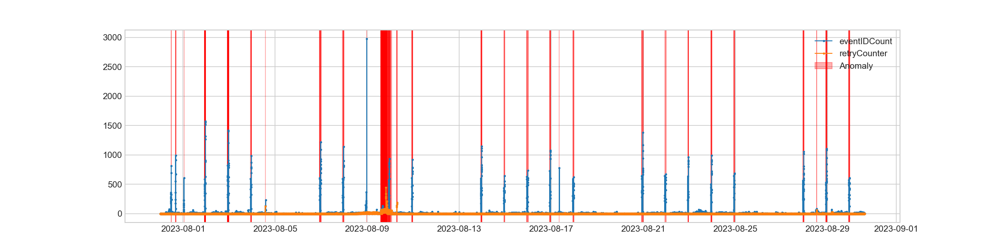

In [153]:
outlier_detector_multievent_minute = OutlierDetector(IsolationForest(contamination=float(0.01), random_state=0))
anomalies_multievent_minute = outlier_detector_multievent_minute.fit_detect(inner_merged_event_minute1)
plot(inner_merged_event_minute1, anomaly=anomalies_multievent_minute, ts_linewidth=1, ts_markersize=3, anomaly_color='red', anomaly_alpha=0.3, curve_group='all');